# Exercícios - Aula 4

## Importando as bibliotecas que vão ser usadas

In [67]:
import random
random.seed(42)

import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.decomposition import PCA
from sklearn.metrics import accuracy_score
from sklearn.naive_bayes import GaussianNB
from scipy.stats import multivariate_normal
from sklearn.neighbors import KernelDensity
from sklearn.naive_bayes import CategoricalNB
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split


plt.style.use("ggplot")

## Exercícios

### 1 - Repita todos os passos acima para a base de dados BreastCancer.

In [16]:
# Lê os dados de um arquivo .csv

data = pd.read_csv('data/BreastCancer.csv', header = (0))
data = data.drop(data.columns[0], axis = 1) # Drop the ID column
data = data.dropna(axis = 'rows') # Remove linhas que contenham NaN (not a number)

data.head(10)

,Cl.thickness,Cell.size,Cell.shape,Marg.adhesion,Epith.c.size,Bare.nuclei,Bl.cromatin,Normal.nucleoli,Mitoses,Class
0,5,1,1,1,2,1.0,3,1,1,0
1,5,4,4,5,7,10.0,3,2,1,0
2,3,1,1,1,2,2.0,3,1,1,0
3,6,8,8,1,3,4.0,3,7,1,0
4,4,1,1,3,2,1.0,3,1,1,0
5,8,10,10,8,7,10.0,9,7,1,1
6,1,1,1,1,2,10.0,3,1,1,0
7,2,1,2,1,2,1.0,3,1,1,0
8,2,1,1,1,2,1.0,1,1,5,0
9,4,2,1,1,2,1.0,2,1,1,0


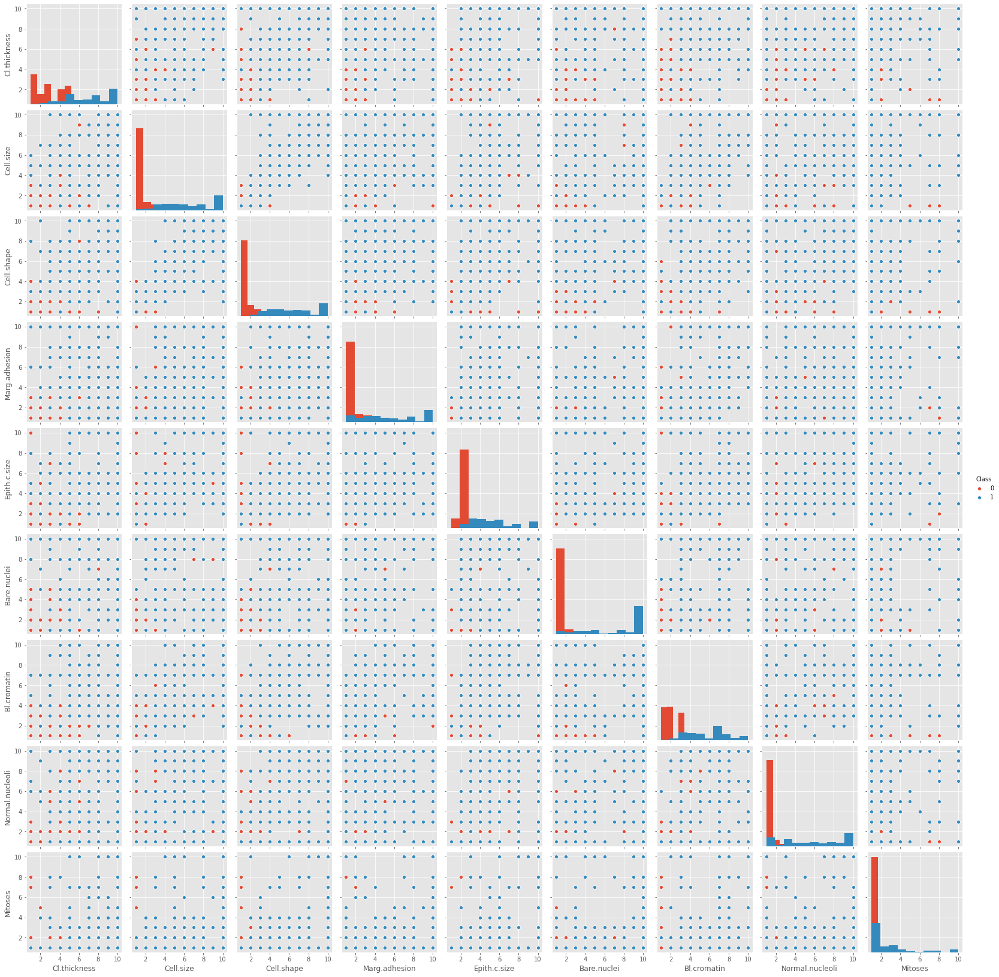

In [17]:
sns.pairplot(data, hue = "Class", diag_kind = "hist")
plt.show()

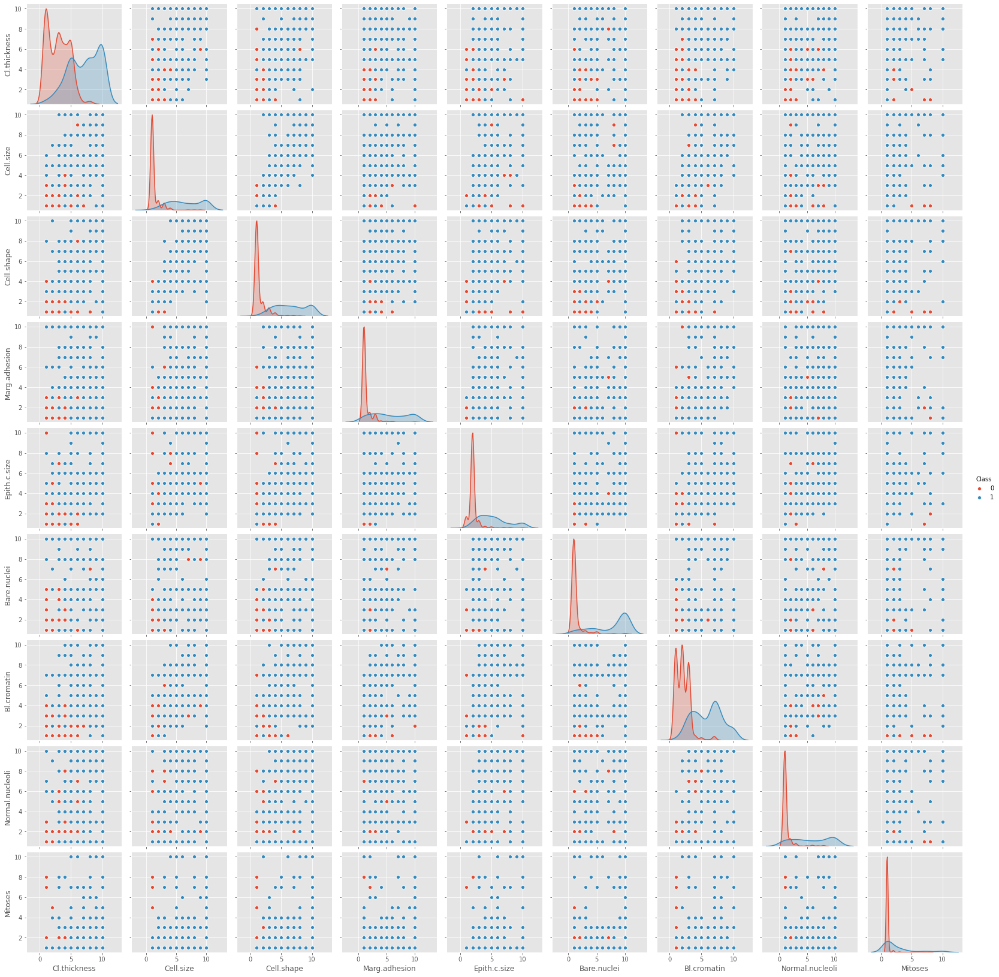

In [24]:
sns.pairplot(data, hue = "Class")
plt.show()

In [3]:
# Vamos armazenar os nomes das classes possíveis do dataset em uma numpy array
classes = np.array(pd.unique(data[data.columns[-1]]), dtype = int)

classes

array([0, 1])

In [4]:
print("O dataset contém {} atributos e {} observações.".format(data.shape[1], data.shape[0]))
print("Atributos do dataset:")

list(data.columns)

O dataset contém 10 atributos e 683 observações.
Atributos do dataset:


['Cl.thickness',
 'Cell.size',
 'Cell.shape',
 'Marg.adhesion',
 'Epith.c.size',
 'Bare.nuclei',
 'Bl.cromatin',
 'Normal.nucleoli',
 'Mitoses',
 'Class']

In [5]:
# Converte os dados em uma array do numpy
data_np = data.to_numpy()

data_np

array([[ 5.,  1.,  1., ...,  1.,  1.,  0.],
       [ 5.,  4.,  4., ...,  2.,  1.,  0.],
       [ 3.,  1.,  1., ...,  1.,  1.,  0.],
       ...,
       [ 5., 10., 10., ..., 10.,  2.,  1.],
       [ 4.,  8.,  6., ...,  6.,  1.,  1.],
       [ 4.,  8.,  8., ...,  4.,  1.,  1.]])

In [6]:
# Vamos guardar as nossas clsses em y (que vamos tentar predizer)
y = data_np[:,-1]
# E as amostras com seus atributos em X
X = data_np[:,0:data.shape[1]-1]

print(y[0], X[0])

data.head(1)

0.0 [5. 1. 1. 1. 2. 1. 3. 1. 1.]


,Cl.thickness,Cell.size,Cell.shape,Marg.adhesion,Epith.c.size,Bare.nuclei,Bl.cromatin,Normal.nucleoli,Mitoses,Class
0,5,1,1,1,2,1.0,3,1,1,0


In [11]:
# Para treinar o classificador vamos separar o dataset em training set e test set (70% train set e 30% test set)

x_train, x_test, y_train, y_test = train_test_split(X, y, train_size = 0.3, random_state = 42)

x_train.shape, x_test.shape

((204, 9), (479, 9))

Vamos afirmar que as variáveis seguem uma distribuição categória (que elas sejam discretas), dado que cada atributo segue um intervalo bem definido e verificamos (graficamente) que os dados não aparentam seguir uma distribuição normal:

In [22]:
model = CategoricalNB()
model.fit(x_train, y_train)

y_pred = model.predict(x_test)

score = accuracy_score(y_pred, y_test)
print('Accuracy:', score)

Accuracy: 0.9728601252609603


Para afim de comparações vamos tentar com uma distribuição normal (mesmo tendo assumido que os atributos são categóricos):

In [23]:
model = GaussianNB()
model.fit(x_train, y_train)

y_pred = model.predict(x_test)

score = accuracy_score(y_pred, y_test)
print('Accuracy:', score)

Accuracy: 0.9561586638830898


### 2 - Considere a base `vertebralcolumn-3C` e compare o classificadores: Naive Bayes, Classificador Bayesiano paramétrico e o classiificador Bayesiano não-paramétrico.

In [4]:
# Lê os dados de um arquivo .csv

data = pd.read_csv('data/vertebralcolumn-3C.csv', header = (0))
data = data.drop(data.columns[0], axis = 1) # Drop the ID column
data = data.drop_duplicates()
data = data.dropna(axis = 'rows') # Remove linhas que contenham NaN (not a number)

data.head(10)

,pelvic_tilt,lumbar_lordosis_angle,sacral_slope,pelvic_radius,degree_spondylolisthesis,class
0,22.552586,39.609117,40.475232,98.672917,-0.254400,Hernia
1,10.060991,25.015378,28.995960,114.405425,4.564259,Hernia
2,22.218482,50.092194,46.613539,105.985135,-3.530317,Hernia
3,24.652878,44.311238,44.644130,101.868495,11.211523,Hernia
4,9.652075,28.317406,40.060784,108.168725,7.918501,Hernia
5,13.921907,25.124950,26.328293,130.327871,2.230652,Hernia
6,15.864336,37.165934,37.568592,120.567523,5.988551,Hernia
7,10.755611,29.038349,34.611142,117.270067,-10.675871,Hernia
8,13.533753,42.690814,30.256437,125.002893,13.289018,Hernia
9,5.010884,41.948751,31.675469,84.241415,0.664437,Hernia


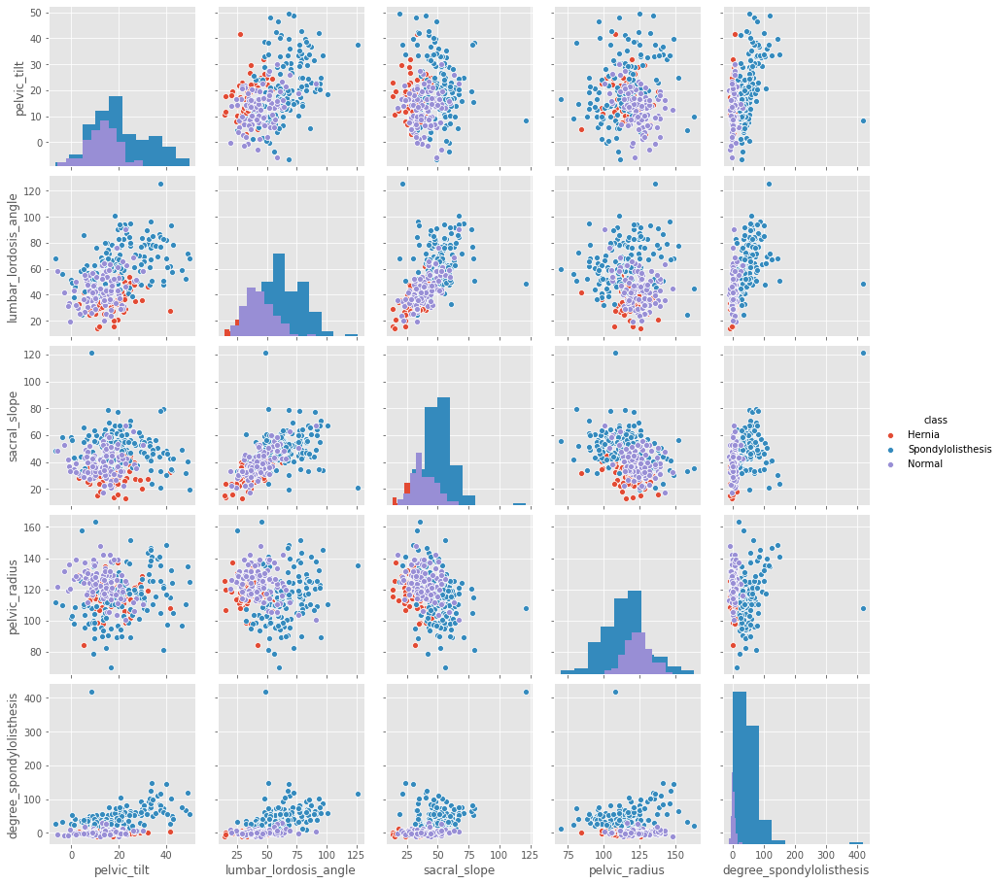

In [6]:
sns.pairplot(data, hue = "class", diag_kind = "hist")
plt.show()

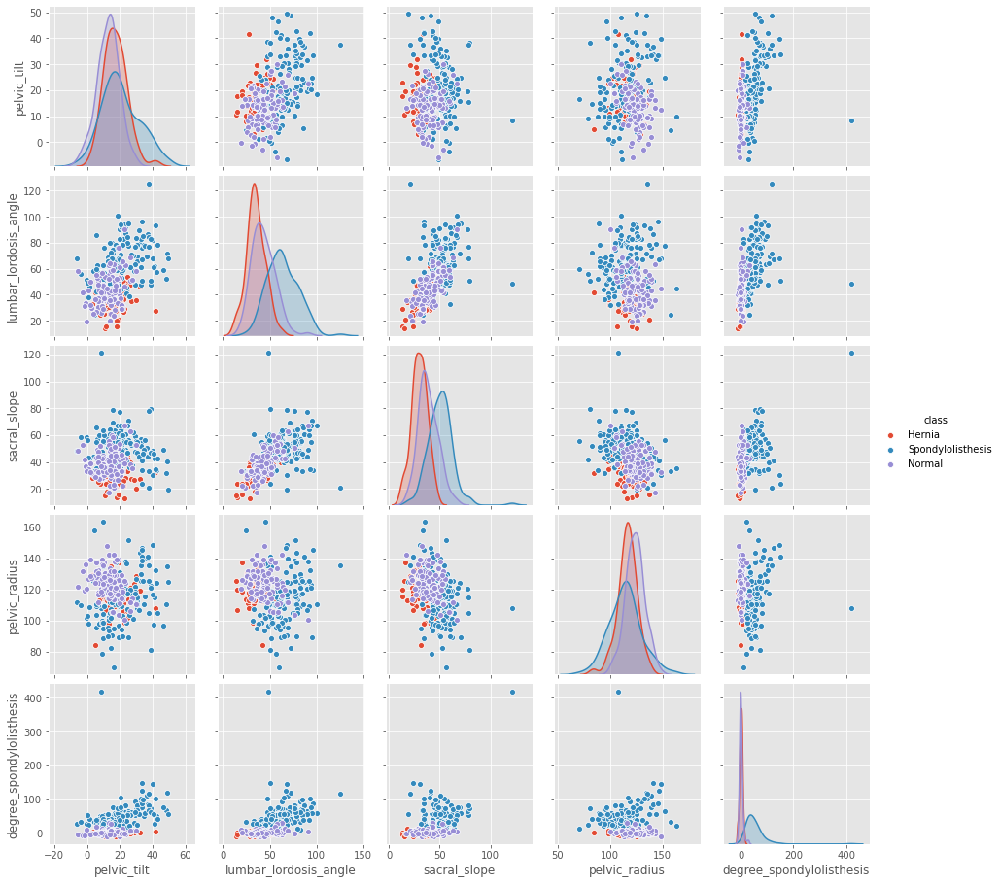

In [5]:
sns.pairplot(data, hue = "class")
plt.show()

In [14]:
# Vamos armazenar os nomes das classes possíveis do dataset em uma numpy array
classes = np.array(pd.unique(data[data.columns[-1]]), dtype = str)

classes

array(['Hernia', 'Spondylolisthesis', 'Normal'], dtype='<U17')

In [15]:
print("O dataset contém {} atributos e {} observações.".format(data.shape[1], data.shape[0]))
print("Atributos do dataset:")

list(data.columns)

O dataset contém 6 atributos e 310 observações.
Atributos do dataset:


['pelvic_tilt',
 'lumbar_lordosis_angle',
 'sacral_slope',
 'pelvic_radius',
 'degree_spondylolisthesis',
 'class']

In [16]:
# Converte os dados em uma array do numpy
data_np = data.to_numpy()

data_np

array([[22.552585999999998, 39.609117, 40.475232, 98.672917, -0.2544,
        'Hernia'],
       [10.060991, 25.015378, 28.995959999999997, 114.405425, 4.564259,
        'Hernia'],
       [22.218482, 50.092194, 46.613539, 105.98513500000001,
        -3.5303169999999997, 'Hernia'],
       ...,
       [22.694968, 46.170347, 38.751628000000004, 125.670725, -2.70788,
        'Normal'],
       [8.693157000000001, 41.583126, 36.559635, 118.545842, 0.21475,
        'Normal'],
       [5.073991, 36.641233, 28.767649, 123.94524399999999, -0.199249,
        'Normal']], dtype=object)

In [17]:
# Vamos guardar as nossas clsses em y (que vamos tentar predizer)
y = data_np[:,-1]
# E as amostras com seus atributos em X
X = data_np[:,0:data.shape[1]-1]

print(y[0], X[0])

data.head(1)

Hernia [22.552585999999998 39.609117 40.475232 98.672917 -0.2544]


,pelvic_tilt,lumbar_lordosis_angle,sacral_slope,pelvic_radius,degree_spondylolisthesis,class
0,22.552586,39.609117,40.475232,98.672917,-0.2544,Hernia


In [18]:
# Normaliza os dados para facilitar os cálculos

scaler = StandardScaler().fit(X)
X_scale = scaler.transform(X)

print("Média dos atributos (normalizados):\n{}\b\nDesvio padrão dos atributos(normalizados):\n{}".format(np.mean(X_scale, axis = 0), np.std(X_scale, axis = 0)))

Média dos atributos (normalizados):
[-4.58414668e-17 -3.66731735e-16 -5.73018335e-17  3.55271368e-16
 -6.87622002e-17
Desvio padrão dos atributos(normalizados):
[1. 1. 1. 1. 1.]


In [19]:
# Para treinar o classificador vamos separar o dataset em training set e test set (70% train set e 30% test set)

x_train, x_test, y_train, y_test = train_test_split(X_scale, y, train_size = 0.3, random_state = 42)

x_train.shape, x_test.shape

((93, 5), (217, 5))

#### Classsifador Bayesiano Paramétrico

In [22]:
# Matriz que vai guardar as probabilidades de P(Ci | X)
P = pd.DataFrame(data = np.zeros((x_test.shape[0], len(classes))), columns = classes)
# Matriz que vai guardar a probabildiade de P(Ci)
Pc = np.zeros(len(classes))

for i in range(len(classes)):
    # Vamos obter os elementos que pertencem a classe Ci no conjunto de treino
    elementos_da_classe = np.where(y_train == classes[i])[0]
    # Calculando a probabilidade de P(Ci)
    Pc[i] = len(elementos_da_classe) / len(y_train)

    print("P(Classe {}): {:.4f}".format(classes[i], Pc[i]))

    # Agora pegamos apenas os elementos que pertencem a classe Ci do x_train
    Z = x_train[elementos_da_classe]
    # Calculando o valor da média amostral
    mu = np.mean(Z, axis = 0)
    # Calculando o valor do desvio padrão amostral
    sigma = np.std(Z, axis = 0)
    # Calculando a matriz de covariância de cada atributo
    cv = np.cov(Z.T)

    # Agora que temos P(Ci | X) podemos calcular P(X | Ci)
    pjj = multivariate_normal.pdf(x_test, mean = mu, cov = cv, allow_singular = True)

    # E colocamos a probabilidade de P(Xj | Ci) no nosso dataframe
    P[classes[i]] = pjj * Pc[i]

P(Classe Hernia): 0.2151
P(Classe Spondylolisthesis): 0.4301
P(Classe Normal): 0.3548


In [23]:
P

,Hernia,Spondylolisthesis,Normal
0,2.806137e-03,2.797615e-05,3.059318e-02
1,1.314269e-09,3.137624e-05,1.749563e-10
2,2.138922e-01,5.529516e-04,6.590044e-02
3,1.728725e-23,9.508647e-04,3.814611e-20
4,9.046115e-02,1.699855e-05,4.504782e-03
...,...,...,...
212,7.280046e-44,6.978293e-06,1.557535e-26
213,1.444562e-01,9.613763e-05,2.058114e-02
214,8.523995e-02,2.270849e-05,3.028095e-03
215,2.177291e-82,1.407625e-07,8.543514e-43


In [24]:
# Agora podemos predizer sobre os nosso dados
y_pred = []

for i in np.arange(0, x_test.shape[0]):
    c = np.argmax(np.array(P.iloc[[i]]))
    y_pred.append(classes[c])
y_pred = np.array(y_pred, dtype=str)

y_pred

array(['Normal', 'Spondylolisthesis', 'Hernia', 'Spondylolisthesis',
       'Hernia', 'Spondylolisthesis', 'Spondylolisthesis',
       'Spondylolisthesis', 'Hernia', 'Hernia', 'Spondylolisthesis',
       'Spondylolisthesis', 'Normal', 'Hernia', 'Normal', 'Hernia',
       'Normal', 'Spondylolisthesis', 'Spondylolisthesis',
       'Spondylolisthesis', 'Spondylolisthesis', 'Spondylolisthesis',
       'Spondylolisthesis', 'Spondylolisthesis', 'Spondylolisthesis',
       'Spondylolisthesis', 'Spondylolisthesis', 'Normal', 'Normal',
       'Normal', 'Spondylolisthesis', 'Normal', 'Spondylolisthesis',
       'Normal', 'Spondylolisthesis', 'Spondylolisthesis', 'Hernia',
       'Normal', 'Spondylolisthesis', 'Spondylolisthesis', 'Hernia',
       'Hernia', 'Spondylolisthesis', 'Normal', 'Normal',
       'Spondylolisthesis', 'Normal', 'Normal', 'Normal',
       'Spondylolisthesis', 'Spondylolisthesis', 'Normal',
       'Spondylolisthesis', 'Spondylolisthesis', 'Spondylolisthesis',
       'Hernia'

In [25]:
score = accuracy_score(y_pred, y_test)

print('Accuracy:', score)

Accuracy: 0.8202764976958525


#### Classificador Bayesiano Não-Paramétrico

In [56]:
# Matriz que vai guardar as probabilidades de P(Ci | X)
P = pd.DataFrame(data = np.zeros((x_test.shape[0], len(classes))), columns = classes)
# Matriz que vai guardar a probabildiade de P(Ci)
Pc = np.zeros(len(classes))

for i in range(len(classes)):
    # Vamos obter os elementos que pertencem a classe Ci no conjunto de treino
    elementos_da_classe = np.where(y_train == classes[i])[0]
    # Calculando a probabilidade de P(Ci)
    Pc[i] = len(elementos_da_classe) / len(y_train)

    print("P(Classe {}): {:.4f}".format(classes[i], Pc[i]))

    # Agora pegamos apenas os elementos que pertencem a classe Ci do x_train
    Z = x_train[elementos_da_classe]
    
    # Agora aplicamos a função kernel (gaussiana) com h = 0.73
    kde = KernelDensity(kernel = "gaussian", bandwidth = 0.73).fit(Z)

    pjj = np.exp(kde.score_samples(x_test))

    # E colocamos a probabilidade de P(Xj | Ci) no nosso dataframe
    P[classes[i]] = pjj * Pc[i]

P(Classe Hernia): 0.2151
P(Classe Spondylolisthesis): 0.4301
P(Classe Normal): 0.3548


In [57]:
P

,Hernia,Spondylolisthesis,Normal
0,2.175038e-03,0.000308,3.276637e-03
1,8.886684e-06,0.000194,9.572487e-06
2,4.268002e-03,0.000547,4.372082e-03
3,4.626078e-07,0.000198,1.900928e-06
4,3.027947e-03,0.000261,9.490805e-04
...,...,...,...
212,1.733028e-06,0.000042,3.631442e-08
213,4.414626e-03,0.000226,2.496631e-03
214,3.404046e-03,0.000143,1.193464e-03
215,3.289905e-13,0.000002,3.870160e-09


In [58]:
# Agora podemos predizer sobre os nosso dados
y_pred = []

for i in np.arange(0, x_test.shape[0]):
    c = np.argmax(np.array(P.iloc[[i]]))
    y_pred.append(classes[c])
y_pred = np.array(y_pred, dtype=str)

y_pred

array(['Normal', 'Spondylolisthesis', 'Normal', 'Spondylolisthesis',
       'Hernia', 'Spondylolisthesis', 'Spondylolisthesis',
       'Spondylolisthesis', 'Hernia', 'Hernia', 'Spondylolisthesis',
       'Spondylolisthesis', 'Normal', 'Hernia', 'Normal', 'Hernia',
       'Normal', 'Spondylolisthesis', 'Normal', 'Spondylolisthesis',
       'Normal', 'Spondylolisthesis', 'Spondylolisthesis',
       'Spondylolisthesis', 'Spondylolisthesis', 'Spondylolisthesis',
       'Spondylolisthesis', 'Normal', 'Normal', 'Normal',
       'Spondylolisthesis', 'Spondylolisthesis', 'Spondylolisthesis',
       'Normal', 'Spondylolisthesis', 'Spondylolisthesis', 'Hernia',
       'Normal', 'Spondylolisthesis', 'Spondylolisthesis', 'Hernia',
       'Hernia', 'Spondylolisthesis', 'Normal', 'Normal',
       'Spondylolisthesis', 'Normal', 'Normal', 'Normal',
       'Spondylolisthesis', 'Spondylolisthesis', 'Normal',
       'Spondylolisthesis', 'Spondylolisthesis', 'Spondylolisthesis',
       'Normal', 'Hernia',

In [59]:
score = accuracy_score(y_pred, y_test)

print('Accuracy:', score)

Accuracy: 0.783410138248848


#### Implementação do Naive Bayes (considerando que os atributos sigam uma distribuição normal)

In [60]:
model = GaussianNB()
model.fit(x_train, y_train)

y_pred = model.predict(x_test)

score = accuracy_score(y_pred, y_test)
print('Accuracy:', score)

Accuracy: 0.8110599078341014


### 3 - Considerando a base de dados Vehicle, projete os dados em duas dimensões usando PCA e mostre as regiões de separação como feito acima.

In [61]:
# Lê os dados de um arquivo .csv

data = pd.read_csv('data/Vehicle.csv', header = (0))
data = data.drop(data.columns[0], axis = 1) # Drop the ID column
data = data.drop_duplicates()
data = data.dropna(axis = 'rows') # Remove linhas que contenham NaN (not a number)

data.head(10)

,Circ,D.Circ,Rad.Ra,Pr.Axis.Ra,Max.L.Ra,Scat.Ra,Elong,Pr.Axis.Rect,Max.L.Rect,Sc.Var.Maxis,Sc.Var.maxis,Ra.Gyr,Skew.Maxis,Skew.maxis,Kurt.maxis,Kurt.Maxis,Holl.Ra,Class
0,48,83,178,72,10,162,42,20,159,176,379,184,70,6,16,187,197,van
1,41,84,141,57,9,149,45,19,143,170,330,158,72,9,14,189,199,van
2,50,106,209,66,10,207,32,23,158,223,635,220,73,14,9,188,196,saab
3,41,82,159,63,9,144,46,19,143,160,309,127,63,6,10,199,207,van
4,44,70,205,103,52,149,45,19,144,241,325,188,127,9,11,180,183,bus
5,57,106,172,50,6,255,26,28,169,280,957,264,85,5,9,181,183,bus
6,43,73,173,65,6,153,42,19,143,176,361,172,66,13,1,200,204,bus
7,43,66,157,65,9,137,48,18,146,162,281,164,67,3,3,193,202,van
8,34,62,140,61,7,122,54,17,127,141,223,112,64,2,14,200,208,van
9,44,98,197,62,11,183,36,22,146,202,505,152,64,4,14,195,204,saab


In [62]:
# Vamos armazenar os nomes das classes possíveis do dataset em uma numpy array
classes = np.array(pd.unique(data[data.columns[-1]]), dtype = str)

classes

array(['van', 'saab', 'bus', 'opel'], dtype='<U4')

In [63]:
print("O dataset contém {} atributos e {} observações.".format(data.shape[1], data.shape[0]))
print("Atributos do dataset:")

list(data.columns)

O dataset contém 18 atributos e 846 observações.
Atributos do dataset:


['Circ',
 'D.Circ',
 'Rad.Ra',
 'Pr.Axis.Ra',
 'Max.L.Ra',
 'Scat.Ra',
 'Elong',
 'Pr.Axis.Rect',
 'Max.L.Rect',
 'Sc.Var.Maxis',
 'Sc.Var.maxis',
 'Ra.Gyr',
 'Skew.Maxis',
 'Skew.maxis',
 'Kurt.maxis',
 'Kurt.Maxis',
 'Holl.Ra',
 'Class']

In [64]:
# Converte os dados em uma array do numpy
data_np = data.to_numpy()

data_np

array([[48, 83, 178, ..., 187, 197, 'van'],
       [41, 84, 141, ..., 189, 199, 'van'],
       [50, 106, 209, ..., 188, 196, 'saab'],
       ...,
       [54, 101, 222, ..., 187, 201, 'saab'],
       [36, 78, 146, ..., 190, 195, 'saab'],
       [36, 66, 123, ..., 186, 190, 'van']], dtype=object)

In [65]:
# Vamos guardar as nossas clsses em y (que vamos tentar predizer)
y = data_np[:,-1]
# E as amostras com seus atributos em X
X = data_np[:,0:data.shape[1]-1]

print(y[0], X[0])

data.head(1)

van [48 83 178 72 10 162 42 20 159 176 379 184 70 6 16 187 197]


,Circ,D.Circ,Rad.Ra,Pr.Axis.Ra,Max.L.Ra,Scat.Ra,Elong,Pr.Axis.Rect,Max.L.Rect,Sc.Var.Maxis,Sc.Var.maxis,Ra.Gyr,Skew.Maxis,Skew.maxis,Kurt.maxis,Kurt.Maxis,Holl.Ra,Class
0,48,83,178,72,10,162,42,20,159,176,379,184,70,6,16,187,197,van


In [66]:
# Normaliza os dados para facilitar os cálculos

scaler = StandardScaler().fit(X)
X_scale = scaler.transform(X)

print("Média dos atributos (normalizados):\n{}\b\nDesvio padrão dos atributos(normalizados):\n{}".format(np.mean(X_scale, axis = 0), np.std(X_scale, axis = 0)))

Média dos atributos (normalizados):
[-3.14956886e-16 -3.65349988e-16 -1.67977006e-16  3.77948264e-17
 -1.63777581e-16 -3.56951138e-16  1.72176431e-16  1.67977006e-17
  8.27286755e-16 -9.02876408e-17 -1.46979880e-16  3.73748839e-16
 -6.92905150e-16 -5.24928144e-17 -2.93959761e-17 -1.31022065e-15
  1.52649104e-15
Desvio padrão dos atributos(normalizados):
[1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]


#### Agora vamos ver o PCA com os dados já padronizados

In [79]:
pca = PCA(n_components = 2)
pca.fit(X_scale)

PCA(n_components=2)

In [82]:
pca.explained_variance_ratio_

array([0.51421935, 0.17489835])

In [81]:
principalComponents = pca.transform(X)
data_pca = pd.DataFrame(principalComponents, columns = ["pc1", "pc2"])
data_pca["Class"] = data["Class"]

data_pca.head(10)

,pc1,pc2,Class
0,441.051134,-146.644343,van
1,392.016866,-147.856198,van
2,584.445636,-132.098873,saab
3,376.463138,-173.340388,van
4,442.861351,-116.888667,bus
5,731.609662,-77.606648,bus
6,416.784330,-160.476299,bus
7,370.370776,-156.164874,van
8,308.835291,-178.172609,van
9,495.487237,-162.802284,saab


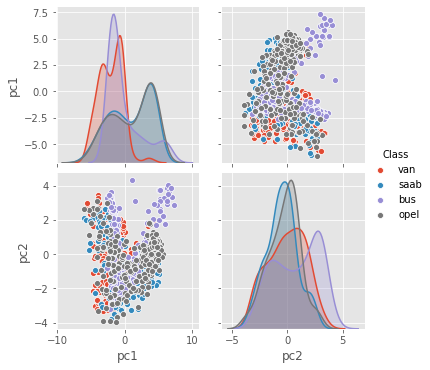

In [75]:
sns.pairplot(data_pca, hue = "Class")
plt.show()

#### Todo: Classificador Naive Bayes e verificação das regiões de separação

### 6 - (Facultativo) Escolha outras distribuições de probabilidade e implemente um algoritmo Naive Bayes geral. Ou seja, o algoritmo faz a classificação usando várias distribuições e obtém o melhor resultado, mostrando também qual a distribuição mais adequada.

### 7 - (Para pensar) É possível implementar o Naive Bayes heterogêneo, ou seja, com diferentes distribuições para cada atributo?

> Sim, é possível pensar em um Naive Bayes heterogêneo, para o caso de termos dados em que atributos possam ter valores categóricos como: sexo; e outro atributo contínuo seguindo uma distribuição normal.

### 8 - (Desafio) Gere dados com diferentes níveis de correlação entre as variáveis e verifique se a perfomance do algoritmo muda com a correlação.